## SOME KEY CONCEPTS:
> Image Noise

In [32]:
import numpy as np
import matplotlib.pyplot as plt
import cv2
import cv2 as cv
import numpy as np
import datetime as dt
from scipy.signal import convolve2d
import math

## IMAGES - Read, Write and Show images

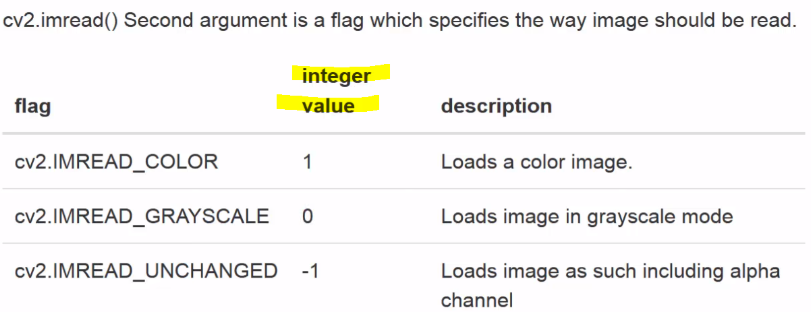

In [8]:
# Read Image
img = cv2.imread('./images/baboon.jpg', 1) #img will be equal to 'NONE' when the file path specified is incorrect

# Show Image
cv2.imshow('image', img)

cv2.waitKey(5000) 
# here we specify 5000, it means that the popup window will close in span of 5 seconds
# But if we say waitKey(0), then the pop up window wont close automatically, as we need to close the window manually

cv2.destroyAllWindows()

print(img[0]) #gives us the pixel value of the image
print(img.shape)

# Writing Image
cv2.imwrite('./images/Satwik_copy.jpg', img) # 'Satwik_copy.jpg' : name of the file

[[101 150 160]
 [ 12  61  71]
 [  0  44  57]
 ...
 [ 52 120 127]
 [ 90 164 146]
 [120 195 167]]
(512, 512, 3)


True

In [60]:
# Wait key functionality
img = cv2.imread('./images/baboon.jpg', 1) #img will be equal to 'NONE' when the file path specified is incorrect
cv2.imshow('image', img)


key_pressed  = cv2.waitKey(0)  # key_pressed has the key which the user has presssed
if key_pressed == 27: # pressed ESC key : ASCII CODE 27 ==> https://theasciicode.com.ar/ascii-control-characters/escape-ascii-code-27.html
    cv2.destroyAllWindows()
else:
    print('Please press escape to close the window')

cv2.destroyAllWindows()

# another method of getting the key pressed is 'ord': ord('s')

error: OpenCV(4.1.0) C:\projects\opencv-python\opencv\modules\highgui\src\window.cpp:352: error: (-215:Assertion failed) size.width>0 && size.height>0 in function 'cv::imshow'


## VIDEO - Read

In [19]:
## READING AND WRITIMG VIDEOS USING WEBCAM


video = cv2.VideoCapture(0)

while(True):
    
    # ret: gives us a true or a false value, frame: get frame
    ret, frame = video.read() # ret = 'True' if frame available
    
    #changing the color of the frame to gray
    gray = cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY)
    
    # Geting the height and width of the frame captured
    print('HEIGHT : ', video.get(cv2.CAP_PROP_FRAME_HEIGHT)) # 640 x 480 is the height and width of the frame by default
    print('WEIGHT : ', video.get(cv2.CAP_PROP_FRAME_WIDTH))
          
    cv2.imshow('video frame reading', gray)
    if cv2.waitKey(1) & 0xFF == ord('s'):
        break
        
video.release() 
cv2.destroyAllWindows()

HEIGHT :  480.0
WEIGHT :  640.0
HEIGHT :  480.0
WEIGHT :  640.0
HEIGHT :  480.0
WEIGHT :  640.0
HEIGHT :  480.0
WEIGHT :  640.0
HEIGHT :  480.0
WEIGHT :  640.0
HEIGHT :  480.0
WEIGHT :  640.0
HEIGHT :  480.0
WEIGHT :  640.0
HEIGHT :  480.0
WEIGHT :  640.0
HEIGHT :  480.0
WEIGHT :  640.0
HEIGHT :  480.0
WEIGHT :  640.0
HEIGHT :  480.0
WEIGHT :  640.0
HEIGHT :  480.0
WEIGHT :  640.0
HEIGHT :  480.0
WEIGHT :  640.0
HEIGHT :  480.0
WEIGHT :  640.0
HEIGHT :  480.0
WEIGHT :  640.0
HEIGHT :  480.0
WEIGHT :  640.0
HEIGHT :  480.0
WEIGHT :  640.0
HEIGHT :  480.0
WEIGHT :  640.0
HEIGHT :  480.0
WEIGHT :  640.0


In [23]:
## READING USING STORED VIDEO

video = cv2.VideoCapture('./images/test.avi')


# video.isOpened() gives True if the file path is correct
# video.isOpened() gives False if the file path is not correct
print('video.isOpened() : ', video.isOpened())

while(video.isOpened()):
    
    ret, frame = video.read()
    if ret == True:
        cv2.imshow('video frame reading', frame)
        if cv2.waitKey(1) & 0xFF == ord('s'):
            break
     
    else:
        break
        
video.release() 
cv2.destroyAllWindows()


video.isOpened() :  False


## VIDEO - WRITE Locally

In [21]:
# fourcc conversion: FOURCC is short for "four character code" - an identifier for a video codec, compression format, color or pixel format used in media files

# writing the webcam captured video in the local system

video = cv2.VideoCapture(0)
fourcc = cv2.VideoWriter_fourcc('X','V','I','D') # https://www.fourcc.org/xvid/
out = cv2.VideoWriter('./images/My_video_made.avi', fourcc, 20, (640,480) ) # 20 : frames per second; (640,480) : size of the frame

print('video.isOpened() : ', video.isOpened())
while(video.isOpened()):
    ret, frame = video.read()
    if ret == True:
        cv2.imshow('video frame reading', frame)
        out.write(frame)
        if cv2.waitKey(1) & 0xFF == ord('s'):
            break
    else:
        break

video.release()
cv2.destroyAllWindows()

video.isOpened() :  True


## DRAWING AND WRITING ON IMAGES

##### cv2.line() : 
Used to draw line on an image.
##### cv2.rectangle() :
Used to draw rectangle on an image.
##### cv2.circle() : 
Used to draw circle on an image.
##### cv2.putText() :
Used to write text on image.

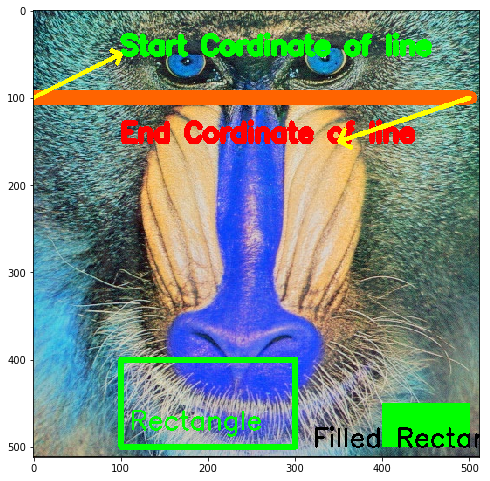

In [100]:
# draw a line

img = cv2.imread('./images/Satwik_copy.jpg', 1)
font = cv2.FONT_HERSHEY_SIMPLEX
cv2.line(img, (0,100), (500,100), (255,100,0), 15) 
# (0,100) : start cordinate
# ((500,100)) : end cordinate
# (255,0,0) : its the color code
# 15: line width


cv2.putText(img, 'Start Cordinate of line', (100,50),font, 1 ,(0,255,0), 5) 
# (100,50) : cordinates to put the text 

cv2.putText(img, 'End Cordinate of line', (100,150),font, 1 ,(255,0,0), 5)

# Drawing an arrowed line
cv2.arrowedLine(img, (0,100), (100,50), (255,255,0), 4)
cv2.arrowedLine(img, (500,100), (350,150), (255,255,0), 4)

# Drawing a rectangle on an image
cv2.rectangle(img, (100,500),(300,400), (0,255,0), 5)
cv2.putText(img, 'Rectangle', (110,480),font, 1 ,(0,255,0), 2)

# drawing a rectangle and filling it
cv2.rectangle(img, (400,500),(500,450), (0,255,0), -1)
cv2.putText(img, 'Filled Rectangle', (320,500),font, 1 ,(0,0,0), 2)

# image display
plt.figure(figsize=(8,15))
plt.imshow(img)
cv2.waitKey(0)
cv2.destroyAllWindows()


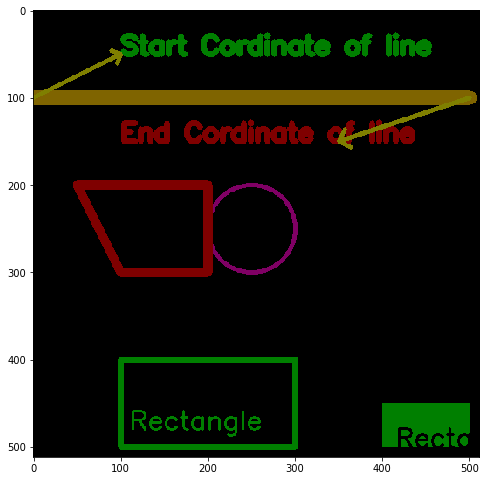

In [128]:
# draw a line

img = np.zeros([512,512,3], np.int8)
font = cv2.FONT_HERSHEY_SIMPLEX
cv2.line(img, (0,100), (500,100), (255,100,0), 15) 

cv2.putText(img, 'Start Cordinate of line', (100,50),font, 1 ,(0,255,0), 5) 
# (100,50) : cordinates to put the text 

cv2.putText(img, 'End Cordinate of line', (100,150),font, 1 ,(255,0,0), 5)

# Drawing an arrowed line
cv2.arrowedLine(img, (0,100), (100,50), (255,255,0), 4)
cv2.arrowedLine(img, (500,100), (350,150), (255,255,0), 4)

# Drawing a rectangle on an image
cv2.rectangle(img, (100,500),(300,400), (0,255,0), 5)
cv2.putText(img, 'Rectangle', (110,480),font, 1 ,(0,255,0), 2)

# drawing a rectangle and filling it
cv2.rectangle(img, (400,500),(500,450), (0,255,0), -1)
cv2.putText(img, 'Filled Rectangle', (320,500),font, 1 ,(0,0,0), 2)

# drawing a circle
cv2.circle(img, (250,250),50, (255,0,100),3) # center cordicates (100,100), radius  = 50, -1 : negetive linewidth fills the circle

# draw a POLYGON
pts = np.array([[100,300],[200,300],[200,200],[200,200],[100,200], [50,200]], np.int32)
#pts = pts.reshape(-1,1,2) # given in the documentation, you should convert
cv2.polylines(img, [pts],True, (255,0,0), 10, -1) # center cordicates (100,100),True: joins the first and last point


# image display
plt.figure(figsize=(8,15))
plt.imshow(img)
cv2.waitKey(0)
cv2.destroyAllWindows()


## SETTING THE CAMERA PARAMETERS

In [134]:
# setting the height and width of the video being captured

print('default settings')
video = cv2.VideoCapture(0)
print('Height : ', video.get(cv2.CAP_PROP_FRAME_HEIGHT))
print('Width : ', video.get(cv2.CAP_PROP_FRAME_WIDTH))

# chaning the height and the widht using set
print('\nseting the values as 1000,1000')
video.set(cv2.CAP_PROP_FRAME_HEIGHT, 1000)
video.set(cv2.CAP_PROP_FRAME_WIDTH, 1000)
print('Height : ', video.get(cv2.CAP_PROP_FRAME_HEIGHT))
print('Width : ', video.get(cv2.CAP_PROP_FRAME_WIDTH))

# The property like height and width are also aaaociated with the numbers in set function, so alternate way of writing the abpve lines of code
print('\nseting the values as 500,1000')
video.set(3,500)
video.set(4,1000)
print('Height : ', video.get(cv2.CAP_PROP_FRAME_HEIGHT))
print('Width : ', video.get(cv2.CAP_PROP_FRAME_WIDTH))


default settings
Height :  480.0
Width :  640.0

seting the values as 1000,1000
Height :  540.0
Width :  960.0

seting the values as 500,1000
Height :  480.0
Width :  640.0


OUTPUT:
Here we see that even we have set the values to some random number but the camera is setting the height and width to the resolution that is available with it


## SHOWING THE DATE-TIME ON THE VIDEOS

In [2]:
video = cv2.VideoCapture(0)
video.set(cv2.CAP_PROP_FRAME_HEIGHT, 1000)
video.set(cv2.CAP_PROP_FRAME_WIDTH, 1000)

temp = 1

while(video.isOpened()):
    ret, frame = video.read()
    if ret == True:
        font = cv2.FONT_HERSHEY_SIMPLEX
        cv2.putText(frame, str(dt.datetime.now()) ,(600,50),font,1,(0,255,0),3 ) # NOTE: used Date time as string as the parameter expects a string value
        cv2.imshow('VIDEO', frame)
        if cv2.waitKey(1) & 0xFF == ord('s'):
            break
    
    else:
        break

video.release() 
cv2.destroyAllWindows()       

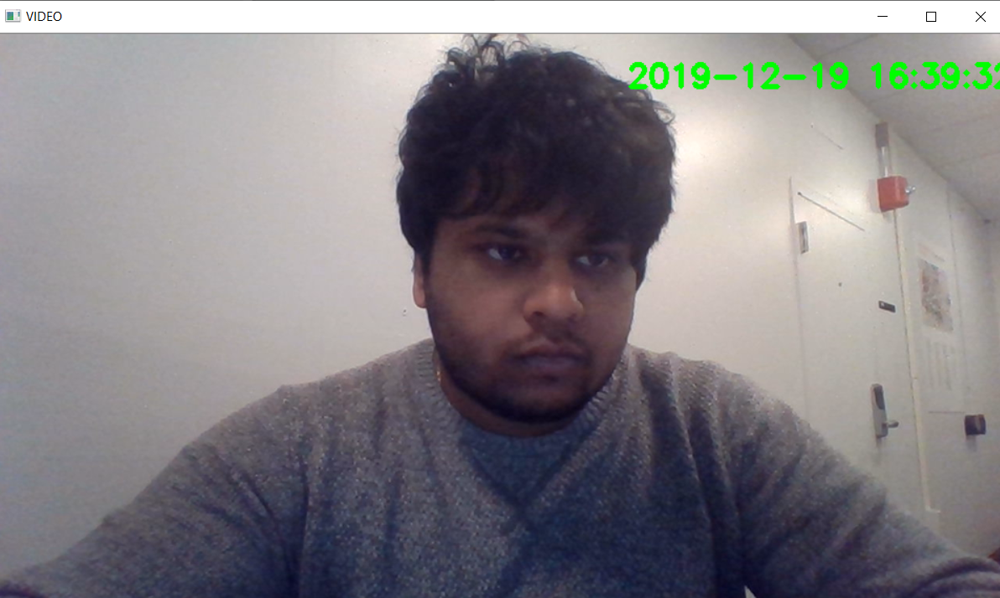

## HANDLE MOUSE EVENTS

>  ### Get the list of all the mouse events available

In [9]:


# dir is inbuilt function and it will show the classes and memeber functions inside cv2
all_cv2 = [i for i in dir(cv2)]
#print(all_cv2) # uncomment to run and see

# getting only with the evenets with events present in it
events = [i for i in dir(cv2) if 'EVENT' in i] # inside the cv2 package
print(events)

['EVENT_FLAG_ALTKEY', 'EVENT_FLAG_CTRLKEY', 'EVENT_FLAG_LBUTTON', 'EVENT_FLAG_MBUTTON', 'EVENT_FLAG_RBUTTON', 'EVENT_FLAG_SHIFTKEY', 'EVENT_LBUTTONDBLCLK', 'EVENT_LBUTTONDOWN', 'EVENT_LBUTTONUP', 'EVENT_MBUTTONDBLCLK', 'EVENT_MBUTTONDOWN', 'EVENT_MBUTTONUP', 'EVENT_MOUSEHWHEEL', 'EVENT_MOUSEMOVE', 'EVENT_MOUSEWHEEL', 'EVENT_RBUTTONDBLCLK', 'EVENT_RBUTTONDOWN', 'EVENT_RBUTTONUP']


>  ### create a mouse call back function which will get executed whenever a mouse event happens

In [15]:
# we need to create a callaback function with the same number of parameters as specified below
# def callback_click_event('event taking place', 'x cordinate for the position being clicked','y cordinate for the position being clicked', flags, params)
    
def callback_click_event(event, x, y, flags, params):
    if event == cv2.EVENT_LBUTTONDOWN: # when left button is clicked
        print('x : ', x, ' y : ', y)
        str_xy = str(x) +' '+ str(y)
        font = cv2.FONT_HERSHEY_SIMPLEX
        cv2.putText(img, str_xy, (x,y),font,.5,(0,255,0), 1)
        cv2.imshow('IMAGE', img) # window name =  IMAGE ==> it should be the same everywhere
    
    # adding new event to get the BGR VALUE
    if event == cv2.EVENT_RBUTTONDOWN:  # when right button is clicked
        blue = img[y,x,0]
        green = img[y,x,1]
        red = img[y,x,2]
        str_bgr = str(blue) +' '+ str(green) + ' '+ str(red)
        
        print('blue : ', blue, ' green : ', green, ' red : ', red)
        font = cv2.FONT_HERSHEY_SIMPLEX
        cv2.putText(img, str_bgr, (x, y),font,.5,(255,255,0), 1)
        cv2.imshow('IMAGE', img)        
        

# drawing our own black image        
img = np.zeros([512,512,3], np.uint8)
cv2.imshow('IMAGE', img)

# put the above function created here
cv2.setMouseCallback('IMAGE', callback_click_event) # parameters: window name, call back fucntion name

# closing the image
cv2.waitKey(0)
cv2.destroyAllWindows()

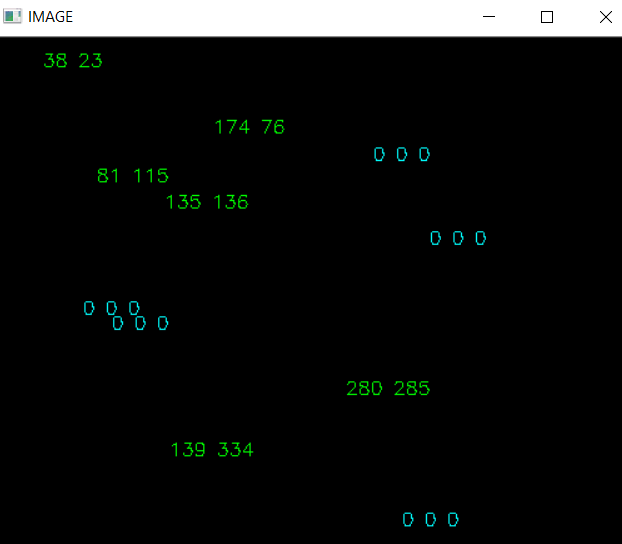

>  ### Get the pixel :
    - rgb value
    - cordinates of the clicked point

In [16]:
# so here we will first create a mouse call back function which will get executed whenever a mouse event happens

# we need to create a callaback function with the same number of parameters as specified below
# def callback_click_event('event taking place', 'x cordinate for the position being clicked','y cordinate for the position being clicked', flags, params)
    
def callback_click_event(event, x, y, flags, params):
    if event == cv2.EVENT_LBUTTONDOWN:
        print('x : ', x, ' y : ', y)
        str_xy = str(x) +' '+ str(y)
        font = cv2.FONT_HERSHEY_SIMPLEX
        cv2.putText(img, str_xy, (x,y),font,.5,(0,255,0), 1)
        cv2.imshow('IMAGE', img) # window name =  IMAGE ==> it should be the same everywhere
    
    # adding new event to get the BGR VALUE
    if event == cv2.EVENT_RBUTTONDOWN:
        blue = img[y,x,0]
        green = img[y,x,1]
        red = img[y,x,2]
        str_bgr = str(blue) +' '+ str(green) + ' '+ str(red)
        
        print('blue : ', blue, ' green : ', green, ' red : ', red)
        font = cv2.FONT_HERSHEY_SIMPLEX
        cv2.putText(img, str_bgr, (x, y),font,.5,(255,255,0), 1)
        cv2.imshow('IMAGE', img)        
        

# drawing our own black image        
img = cv2.imread('./images/Satwik_copy.jpg', 1)
cv2.imshow('IMAGE', img)

# put the above function created here
cv2.setMouseCallback('IMAGE', callback_click_event) # parameters: window name, call back fucntion name

# closing the image
cv2.waitKey(0)
cv2.destroyAllWindows()

x :  200  y :  98
x :  150  y :  187
x :  316  y :  255
x :  282  y :  387
blue :  24  green :  67  red :  238
x :  153  y :  327
blue :  80  green :  88  red :  241
blue :  96  green :  96  red :  220
blue :  148  green :  144  red :  196
blue :  153  green :  150  red :  135


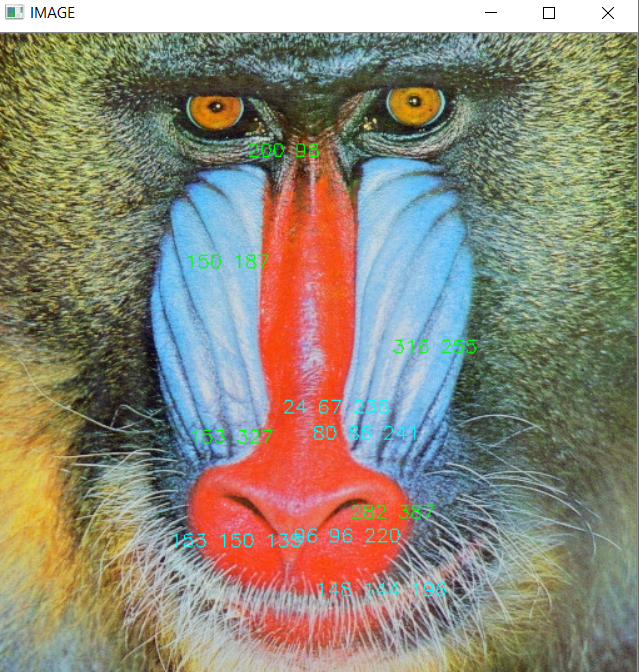

>  ### Joining the points on the image when its clicked

In [31]:
# Joining 2 points on the image whenever we click twice

points = []

def callback_click_event(event, x, y, flags, params):
    if event == cv2.EVENT_LBUTTONDOWN:
        cv2.circle(img,(x,y), 3, (255,0,0), -1)    
        points.append((x,y)) # getting the points which are clicked 
        if len(points) >= 2:
            cv2.line(img, points[-1], points[-2], (255,100,0), 1) 
        cv2.imshow('IMAGE', img)

# drawing our own black image        
img = cv2.imread('./images/Image_1.jpg', 1)
cv2.imshow('IMAGE', img)

# put the above function created here
cv2.setMouseCallback('IMAGE', callback_click_event) # parameters: window name, call back fucntion name

# closing the image
cv2.waitKey(0)
cv2.destroyAllWindows()

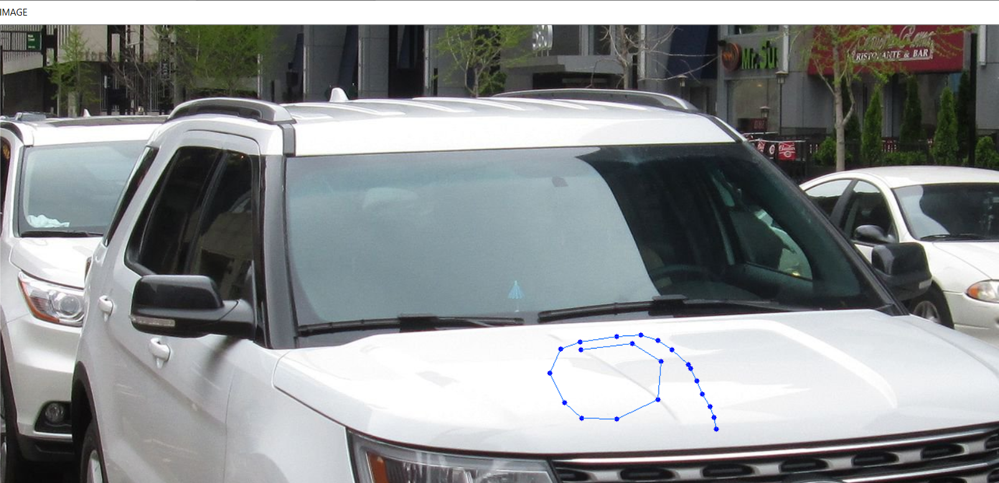

>  ### Showing the color of the pixel in a new tab when we click on it

In [58]:
# Joining 2 points on the image whenever we click twice

points = []

def callback_click_event(event, x, y, flags, params):
    if event == cv2.EVENT_LBUTTONDOWN:
        blue = img[y,x,0]
        green = img[y,x,1]
        red = img[y,x,2]
        str_bgr = str(blue) +' '+ str(green) + ' '+ str(red)
        font = cv2.FONT_HERSHEY_SIMPLEX
        cv2.putText(img, 'you have clicked here', (x, y),font,.5,(0,255,0), 2)
        cv2.circle(img,(x,y), 3, (255,0,0), -1)  
        cv2.imshow('IMAGE', img) 
        
        # opening a new image to show 
        new_image = np.zeros((512,512,3), np.uint8)
        new_image[:] = [blue, green, red]
        cv2.imshow('color of the pixel', new_image)
        
# drawing our own black image        
img = cv2.imread('./images/Image_1.jpg', 1)
cv2.imshow('IMAGE', img)

# put the above function created here
cv2.setMouseCallback('IMAGE', callback_click_event) # parameters: window name, call back fucntion name

# closing the image
cv2.waitKey(0)
cv2.destroyAllWindows()

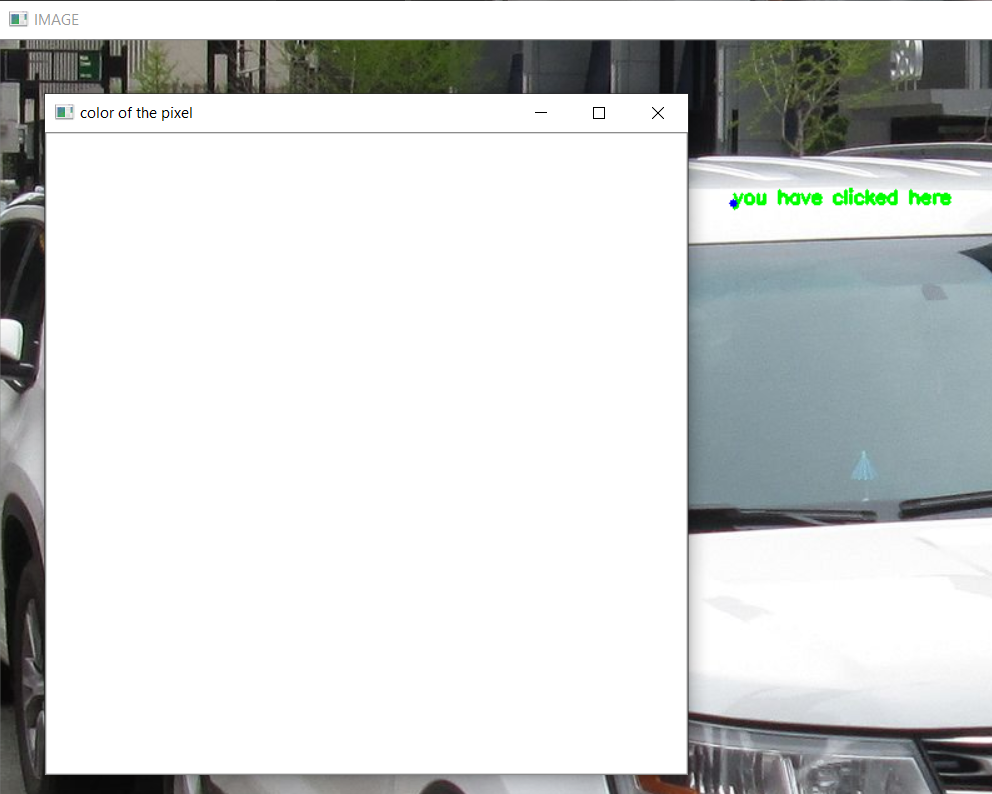

## ARITHMETIC OPERATIONS

> ### img.shape
returns a tuple of number of rows, columns, and channels

> ### img.size
returns Total number of pixels is accessed

> ### img.dtype
returns Image datatype is obtained

> ### cv2.split(img) 
output vector of arrays; the arrays themselves are reallocated, if needed

> ### cv2.merge((b,g,r)) 
The number of channels will be the total number of channels in the matrix array

> ### cv2.resize 
resize the image

> ### dst  cv2.add(img, img2) 
Calculates the per-element sum of two arrays or an array and a scalar.

> ### dst  cv2.addWeighted(img, .2, img2, .8, 0) 
Calculates the weighted sum of two arrays.

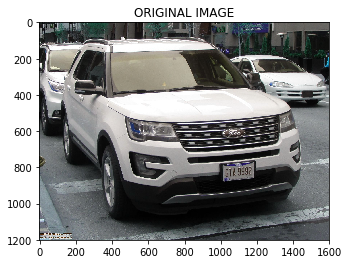

SHAPE :  (1200, 1600, 3)
SIZE :  5760000
DATA TYPE :  uint8

Blue:  [[110 105 106 ... 104 103 101]
 [116 115 118 ... 104 104 103]
 [111 113 116 ... 104 104 104]
 ...
 [101 136 155 ...  84  83  87]
 [ 84 127 165 ...  88  86  88]
 [100 116 154 ...  93  90  92]] 
Green:  [[103  98 102 ... 103 102 100]
 [112 111 114 ... 103 103 102]
 [109 113 117 ... 103 103 103]
 ...
 [126 161 179 ...  89  88  92]
 [108 152 189 ...  93  91  93]
 [124 141 175 ...  98  95  97]] 
Red:  [[110 105 108 ...  99  98  96]
 [118 117 120 ...  99  99  98]
 [115 119 121 ...  99  99  99]
 ...
 [152 187 203 ...  90  89  93]
 [136 178 213 ...  94  92  94]
 [152 167 202 ...  99  96  98]]

 SHOWING THE MERGE OPERATION FROM RGB PIXEL


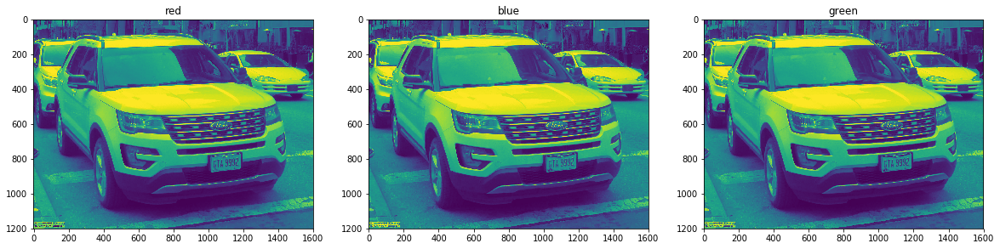

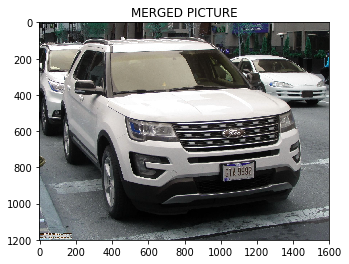

In [25]:
img = cv2.imread('./images/Image_1.jpg', 1)
plt.imshow(img)
plt.title('ORIGINAL IMAGE')
plt.show()

# using arithmetic fuctions here
print('SHAPE : ',img.shape)
print('SIZE : ', img.size)
print('DATA TYPE : ',img.dtype)

# split
b,g,r = cv2.split(img)
print('\nBlue: ', b, '\nGreen: ',g,'\nRed: ', r)

print('\n SHOWING THE MERGE OPERATION FROM RGB PIXEL')
fig = plt.figure(figsize=(20,100))
plt.subplot(1,3, 1)
plt.title('red')
plt.imshow(r)

plt.subplot(1, 3, 2)
plt.title('blue')
plt.imshow(b)

plt.subplot(1, 3, 3)
plt.title('green')
plt.imshow(g)
plt.show()

# merge
img_merge = cv2.merge((b,g,r))
plt.title('MERGED PICTURE')
plt.imshow(img_merge)
plt.show()


> ### ROI - region of intrest
    - Its the region that we are intrested in

In [29]:
# Now imagine our region of intrest is the ford logo on the front of the car

# using the click event to get the cordinates of the ford logo

def callback_click_event(event, x, y, flags, params):
    if event == cv2.EVENT_LBUTTONDOWN:
        print('x : ', x, ' y : ', y)
        str_xy = str(x) +' '+ str(y)
        font = cv2.FONT_HERSHEY_SIMPLEX
        cv2.putText(img, str_xy, (x,y),font,.5,(0,255,0), 1)
        cv2.imshow('IMAGE', img) # window name =  IMAGE ==> it should be the same everywhere
    
    # adding new event to get the BGR VALUE
    if event == cv2.EVENT_RBUTTONDOWN:
        blue = img[y,x,0]
        green = img[y,x,1]
        red = img[y,x,2]
        str_bgr = str(blue) +' '+ str(green) + ' '+ str(red)
        
        print('blue : ', blue, ' green : ', green, ' red : ', red)
        font = cv2.FONT_HERSHEY_SIMPLEX
        cv2.putText(img, str_bgr, (x, y),font,.5,(255,255,0), 1)
        cv2.imshow('IMAGE', img)        
        

# drawing our own black image        
img = cv2.imread('./images/Image_1.jpg', 1)
cv2.imshow('IMAGE', img)

# put the above function created here
cv2.setMouseCallback('IMAGE', callback_click_event) # parameters: window name, call back fucntion name

# closing the image
cv2.waitKey(0)
cv2.destroyAllWindows()


x :  990  y :  582
x :  991  y :  638
x :  1147  y :  640
x :  1147  y :  567


#### understanding cordinate system in ROI


https://stackoverflow.com/questions/15424852/region-of-interest-opencv-python

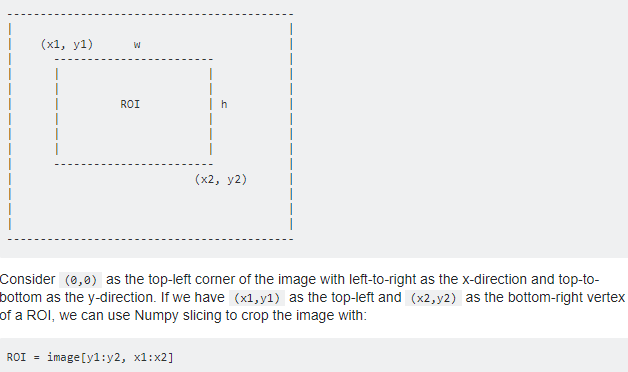


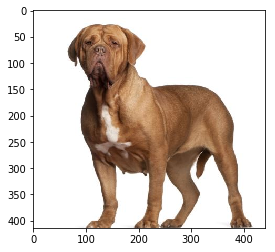

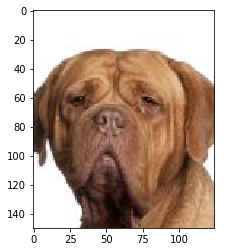

In [69]:
# using nhe above cordinates

img = cv2.imread('./images/dog.jpg', cv2.IMREAD_COLOR)
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
plt.imshow(img)
plt.show()

# cropping the face of the dog
ford_logo  = img[0:150, 75:200]

plt.imshow(ford_logo)
plt.show()

> ### ADDING TWO IMAGES
    - without weight
    - with weight

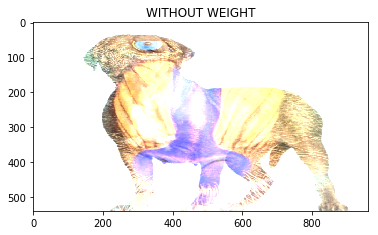

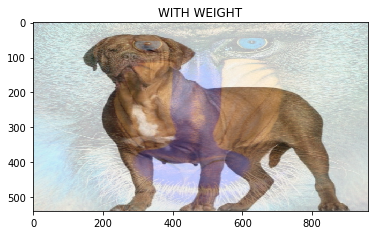

In [70]:
img_1 = cv2.imread('./images/dog.jpg', cv2.IMREAD_COLOR)
img_2 = cv2.imread('./images/Satwik_copy.jpg', cv2.IMREAD_COLOR)
img_1 = cv2.cvtColor(img_1, cv2.COLOR_BGR2RGB)


#resize the image to the same size
img_1 = cv2.resize(img_1, (960, 540)) 
img_2 = cv2.resize(img_2, (960, 540)) 

added_img_without_weight = cv2.add(img_1, img_2)
plt.imshow(added_img_without_weight)
plt.title('WITHOUT WEIGHT')
plt.show()

added_img_with_weight = cv2.addWeighted(img_1,0.7, img_2,0.3, 0)  # 0.3: img_1 importance, 0.7: img_2 importance, 0: gamma value
plt.imshow(added_img_with_weight)
plt.title('WITH WEIGHT')
plt.show()

## BITWISE OPERATION ON IMAGES

> ### bitwise_and()
> ### bitwise_or()
> ### bitwise_xor()
> ### bitwise_not() 

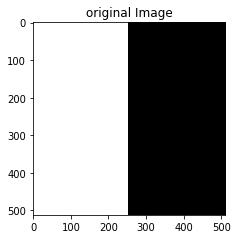

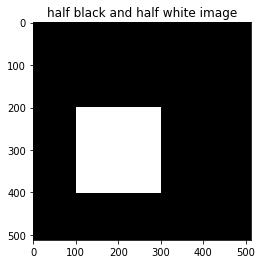

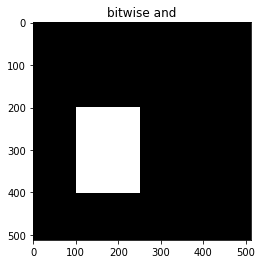

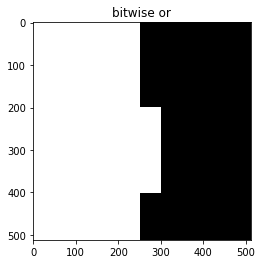

In [4]:
# bitwise_and

# first create our opwn images
fig = plt.figure(figsize=(20,100))

img = np.zeros((512,512,3), np.uint8)
img = cv2.rectangle(img, (250,512), (0,0), (255,255,255), -1)
plt.subplot(1,5, 1)
plt.imshow(img)
plt.title('original Image')
plt.show()

img_2 = np.zeros((512,512,3), np.uint8)
b_and_w_image = cv2.rectangle(img_2, (100,400), (300,200), (255,255,255), -1)
#plt.subplot(1,5, 4)
plt.imshow(b_and_w_image)
plt.title('half black and half white image')
plt.show()

bw_and = cv2.bitwise_and(img, img_2)
plt.title('bitwise and')
plt.imshow(bw_and)
plt.show()

bw_or = cv2.bitwise_or(img, img_2)
plt.title('bitwise or')
plt.imshow(bw_or)
plt.show()

## TRACK BAR

- change some value in image dynamically during runtime

In [8]:
def callback_nothing(x): # this is a call bac function; one argument x: current position of the trackbar
    print(x)

    
img = np.zeros((500,500,3), np.uint8)
cv2.namedWindow('image')

cv2.createTrackbar('B', 'image', 0, 255, callback_nothing) ## Window name: 'image' should be similar in the named window and here
cv2.createTrackbar('G', 'image', 0, 255, callback_nothing)
cv2.createTrackbar('R', 'image', 0, 255, callback_nothing)

while(1):
    cv2.imshow('image',img) 
    k = cv2.waitKey(1) & 0xFF 
    if k == 27:
        break
    b = cv2.getTrackbarPos('B', 'image')
    g = cv2.getTrackbarPos('G', 'image')
    r = cv2.getTrackbarPos('R', 'image')
    
    img[:] = [b,g,r]
    
cv2.destroyAllWindows()

51
51
51
102


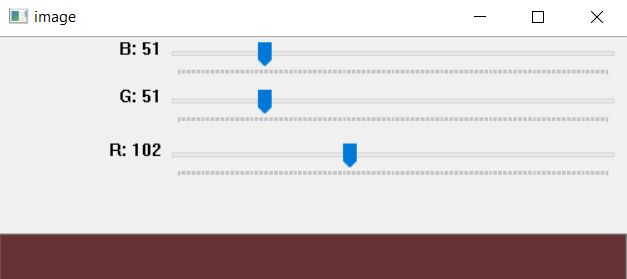

In [13]:
def callback_nothing(x): # this is a call bac function; one argument x: current position of the trackbar
    print(x)

    

cv2.namedWindow('image')

cv2.createTrackbar('A', 'image', 10, 400, callback_nothing) ## Window name: 'image' should be similar in the named window and here
switch = 'color/gray'
cv2.createTrackbar('B', 'image', 0, 1, callback_nothing) ## Window name: 'image' should be similar in the named window and here

while(1):
    img = np.zeros((500,500,3), np.uint8)
    cur_pos_A = cv2.getTrackbarPos('A','image')
    font = cv2.FONT_HERSHEY_SCRIPT_SIMPLEX
    cv2.putText(img,str(cur_pos_A), (350,350), font, 4, (0,255,0), 2)
    
    k = cv2.waitKey(1) & 0xFF 
    if k == 27:
        break
    
    cur_pos_B = cv2.getTrackbarPos('B', 'image') 
    if cur_pos_B == 0:
        pass
    elif cur_pos_B == 1:
        img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    
    cv2.imshow('image',img)    
cv2.destroyAllWindows()

14
23
37
54
64
73
82
86
90
96
99
104
107
108
112
114
115
117
120
121
122
124
126
127
128
129
131
132
135
138
140
145
148
152
155
159
161
163
164
166
168
169
170
173
174
175
176
177
178
180
182
183
184
185
187
190
191
192
195
197
198
201
202
203
204
205
204
202
201
197
194
191
189
185
183
182
181
180
177
175
174
173
171
170
168
166
164
162
161
159
155
154
152
149
147
146
145
143
142
141
140
139
138
136
135


## SWITCH

In [12]:
def callback_nothing(x): # this is a call bac function; one argument x: current position of the trackbar
    pass

    
img = np.zeros((500,500,3), np.uint8)
cv2.namedWindow('image')

cv2.createTrackbar('B', 'image', 0, 255, callback_nothing) ## Window name: 'image' should be similar in the named window and here
cv2.createTrackbar('G', 'image', 0, 255, callback_nothing)
cv2.createTrackbar('R', 'image', 0, 255, callback_nothing)

#creating switch
switch = '0 : OFF\n 1: ON'
cv2.createTrackbar(switch, 'image', 0, 1, callback_nothing)

while(1):
    cv2.imshow('image',img) 
    k = cv2.waitKey(1) & 0xFF 
    if k == 27:
        break
    b = cv2.getTrackbarPos('B', 'image')
    g = cv2.getTrackbarPos('G', 'image')
    r = cv2.getTrackbarPos('R', 'image')
    s = cv2.getTrackbarPos(switch, 'image')
    
    if s == 0:
        pass
    elif s == 1:
        img[:] = [b,g,r]   
        
cv2.destroyAllWindows()

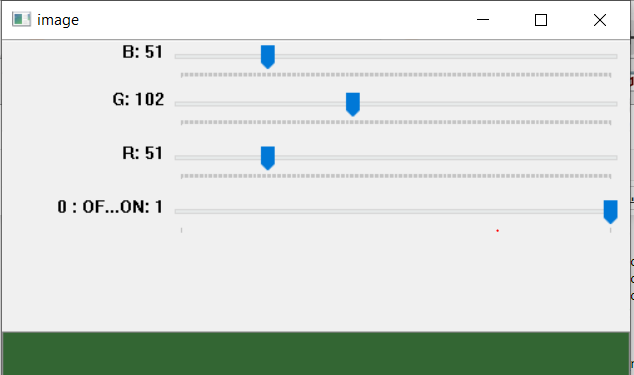


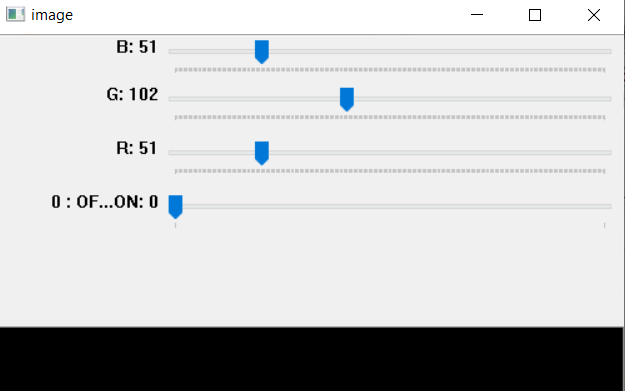

## Object Detection and Object Tracking Using HSV Color Space

-  HSV: Hue Saturation Value  


- 'Hue' represents the color


- 'Saturation' represents the amount to which that respective color is mixed with white 


- 'Value' represents the amount to which that respective color is mixed with black (Gray level)


-  useful when we need color discription

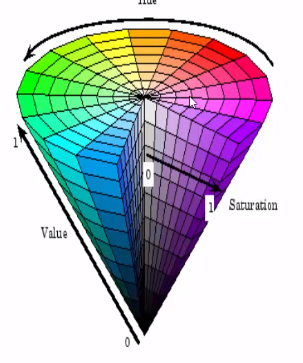


> http://coecsl.ece.illinois.edu/ge423/spring05/group8/FinalProject/HSV_writeup.pdf

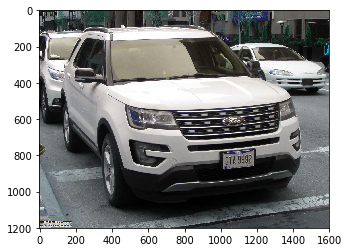

In [11]:
img = cv2.imread(r'./images/Image_1.jpg')
plt.imshow(img)

In [6]:
# now if we want to get only the white portion out of the image

def callback_nothing(x): # this is a call bac function; one argument x: current position of the trackbar
    pass
    #print(x)

    
cv2.namedWindow('image')

cv2.createTrackbar('LH', 'image', 0, 255, callback_nothing) ## Window name: 'image' should be similar in the named window and here
cv2.createTrackbar('LS', 'image', 0, 255, callback_nothing)
cv2.createTrackbar('LV', 'image', 0, 255, callback_nothing)
cv2.createTrackbar('HH', 'image', 255, 255, callback_nothing)
cv2.createTrackbar('HS', 'image', 255, 255, callback_nothing)
cv2.createTrackbar('HV', 'image', 255, 255, callback_nothing)

while(1):
    frame = cv2.imread(r'./images/dog.JPG') 
    hsv = cv2.cvtColor(frame, cv2.COLOR_BGR2HSV)
    
        
    k = cv2.waitKey(1) & 0xFF 
    if k == 27:
        break
        
    # getting values from tracker
    lh = cv2.getTrackbarPos('LH', 'image')
    ls = cv2.getTrackbarPos('LS', 'image')
    lv = cv2.getTrackbarPos('LV', 'image')
    hh = cv2.getTrackbarPos('HH', 'image')
    hs = cv2.getTrackbarPos('HS', 'image')
    hv = cv2.getTrackbarPos('HV', 'image')
    
    l_b = np.array([lh,ls,lv])
    u_b = np.array([hh,hs,hv])
    
    mask = cv2.inRange(hsv, l_b, u_b) # cv2.inRange(img, lower, upper)
    
    res = cv2.bitwise_and(frame, frame, mask = mask)
    cv2.imshow('frame', frame)
    cv2.imshow('mask', mask)
    cv2.imshow('res', res)
    cv2.imshow('hsv', hsv)
    
cv2.destroyAllWindows()

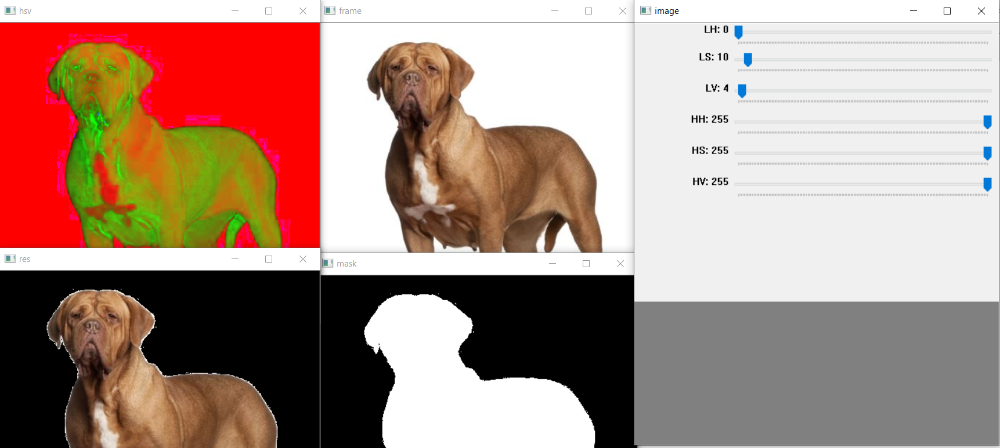

In [3]:
# changing HSV value with video

# now if we want to get only the white portion out of the image

def callback_nothing(x): # this is a call bac function; one argument x: current position of the trackbar
    pass
    #print(x)

cv2.namedWindow('video')

cv2.createTrackbar('LH', 'video', 0, 255, callback_nothing) ## Window name: 'image' should be similar in the named window and here
cv2.createTrackbar('LS', 'video', 0, 255, callback_nothing)
cv2.createTrackbar('LV', 'video', 0, 255, callback_nothing)
cv2.createTrackbar('HH', 'video', 255, 255, callback_nothing)
cv2.createTrackbar('HS', 'video', 255, 255, callback_nothing)
cv2.createTrackbar('HV', 'video', 255, 255, callback_nothing)

video = cv2.VideoCapture(0)

while(video.isOpened()):
    ret, frame = video.read()
    if ret == True:
        hsv = cv2.cvtColor(frame, cv2.COLOR_BGR2HSV)

        # getting values from tracker
        lh = cv2.getTrackbarPos('LH', 'video')
        ls = cv2.getTrackbarPos('LS', 'video')
        lv = cv2.getTrackbarPos('LV', 'video')
        hh = cv2.getTrackbarPos('HH', 'video')
        hs = cv2.getTrackbarPos('HS', 'video')
        hv = cv2.getTrackbarPos('HV', 'video')

        l_b = np.array([lh,ls,lv])
        u_b = np.array([hh,hs,hv])

        mask = cv2.inRange(hsv, l_b, u_b) # cv2.inRange(img, lower, upper)

        res = cv2.bitwise_and(frame, frame, mask = mask)
        
        cv2.imshow('res', res)
       
        k = cv2.waitKey(1) & 0xFF 
        if k == 27:
            break
        
video.release() 
cv2.destroyAllWindows()    


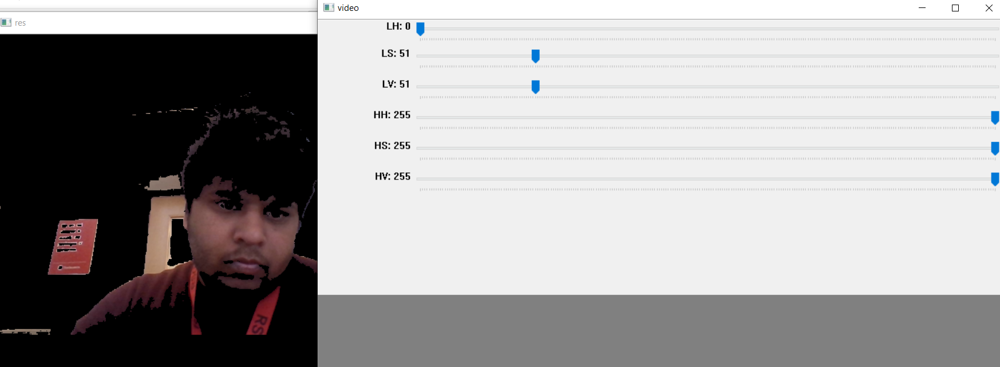

## THRESHOLDING 

- Segmentation of object from background


- Compare each pixel with pre defined threshold value


- Then it divide the pixels into 2 groups : one group having pixel value lower than the threshold value and one above the threshold value

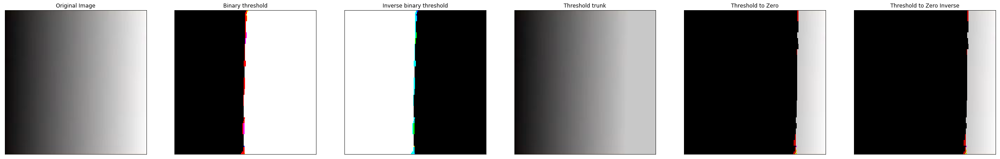

In [59]:
img = cv2.imread(r'./images/gradient.JPG')

# define 2 variables
# In Thresholding we Pick a threshold T
# 1.Pixels above threshold get new intensity A
# 2.Pixels above threshold get new intensity B


# if the value of the opixel is less than 127 --> pixel value assigned 0 (black)
# if the value of the opixel is more than 127 --> pixel value assigned 255 (white)
_, binary_threshold = cv2.threshold(img, 127, 255, cv2.THRESH_BINARY)
_, inv_binary_threshold = cv2.threshold(img, 127, 255, cv2.THRESH_BINARY_INV)
_, threshold_trunk = cv2.threshold(img, 200, 255, cv2.THRESH_TRUNC) # upto the threshold the value of the pixel wont change (upto 200, pixel value donot change).
# after 200, the pixel value willl remain the same which is 200
_, threshold_to_zero = cv2.threshold(img, 200, 255, cv2.THRESH_TOZERO) # whenever pixel value is less than threhsold the value assigned to the pixel will be 0
# when pixel value greater than the threshold then the pixel value remain the same
_, threshold_to_zero_inv = cv2.threshold(img, 200, 255, cv2.THRESH_TOZERO) 

titles = ['Original Image','Binary threshold','Inverse binary threshold', 'Threshold trunk', 'Threshold to Zero', 'Threshold to Zero Inverse']
images = [img, threshold, inv_binary_threshold, threshold_trunk, threshold_to_zero, threshold_to_zero_inv]

plt.figure(figsize=(40,15))
for i in range(6):
    plt.subplot(1,6,i+1),plt.imshow(images[i],'gray')
    plt.title(titles[i])
    plt.xticks([]),plt.yticks([])
plt.show()

## ADAPTIVE THRESHOLD

- Threshold is not global each pixel as we have specified earlier  (as shown by the number 127 below)

        - cv2.threshold(img, 127, 255, cv2.THRESH_BINARY)

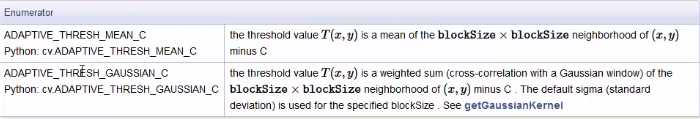

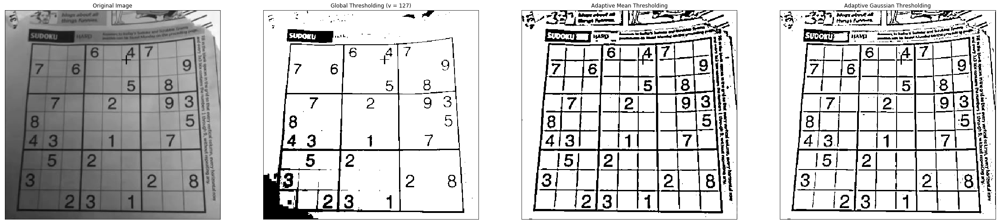

In [56]:
img = cv2.imread(r'./images/soduku.JPG', 0)

_, binary_th = cv2.threshold(img, 60,255,cv2.THRESH_BINARY)
ada_th_mean = cv2.adaptiveThreshold(img, 255, cv2.ADAPTIVE_THRESH_MEAN_C, cv2.THRESH_BINARY, 11, 4)
ada_th_gaussian = cv2.adaptiveThreshold(img, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C, cv2.THRESH_BINARY, 11, 4)

#gaus = cv2.adaptiveThreshold(greyscale, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C,cv2.THRESH_BINARY,99,1)
# 255: max non-zero value
# 11 : block size -> size of the neighbourhood area
# 2 ==> C : constant, which is subtracted from mean


titles = ['Original Image', 'Global Thresholding (v = 127)','Adaptive Mean Thresholding', 'Adaptive Gaussian Thresholding']
images = [img, binary_th, ada_th_mean, ada_th_gaussian]

plt.figure(figsize=(40,15))
for i in range(4):
    plt.subplot(1,4,i+1),plt.imshow(images[i],'gray')
    plt.title(titles[i])
    plt.xticks([]),plt.yticks([])
plt.show()

## USING MATPLOTLIB WITH OPENCV

> Reading Images in
    - Matplotlib uses: RGB, its 2d plotting lib so it shows the pixel on x and y axis
    - Open CV uses: BGR

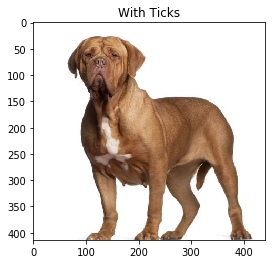

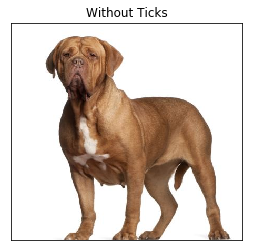

In [68]:
img = cv2.imread(r'./images/dog.JPG')
cv2.imshow('Image CV2', img)
cv2.waitKey(0)
cv2.destroyAllWindows()


img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

plt.imshow(img)
plt.title('With Ticks')
plt.show()

plt.imshow(img)
plt.title('Without Ticks')
plt.xticks([]), plt.yticks([]) # hides the ticks on the x and y axis
plt.show()

## Morphological Transformations
- Operations based on image shape
- performed mostly on binary image
- 2 things required
        - Original Image
        - Kernel - its a square piece to be applied on the image


https://docs.opencv.org/trunk/d9/d61/tutorial_py_morphological_ops.html

> Erosion
    - The basic idea of erosion is just like soil erosion only, it erodes away the boundaries of foreground object (Always try to keep foreground in white). So what it does? The kernel slides through the image (as in 2D convolution). A pixel in the original image (either 1 or 0) will be considered 1 only if all the pixels under the kernel is 1, otherwise it is eroded (made to zero).
    - So what happends is that, all the pixels near boundary will be discarded depending upon the size of kernel. So the thickness or size of the foreground object decreases or simply white region decreases in the image. It is useful for removing small white noises (as we have seen in colorspace chapter), detach two connected objects etc.
    
> Dilation
    - It is just opposite of erosion. Here, a pixel element is '1' if atleast one pixel under the kernel is '1'. So it increases the white region in the image or size of foreground object increases. Normally, in cases like noise removal, erosion is followed by dilation. Because, erosion removes white noises, but it also shrinks our object. So we dilate it. Since noise is gone, they won't come back, but our object area increases. It is also useful in joining broken parts of an object.

> Opening
    - Opening is just another name of erosion followed by dilation. It is useful in removing noise, as we explained above. 

> Closing
    - Closing is reverse of Opening, Dilation followed by Erosion. It is useful in closing small holes inside the foreground objects, or small black points on the object.

> Morphological Gradient
    - It is the difference between dilation and erosion of an image.

> Top Hat
    - It is the difference between input image and Opening of the image. Below example is done for a 9x9 kernel.

> Black Hat
    - It is the difference between the closing of the input image and input image.

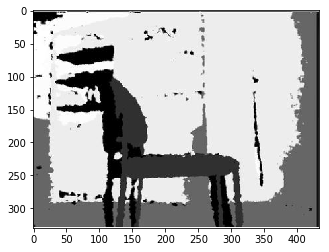

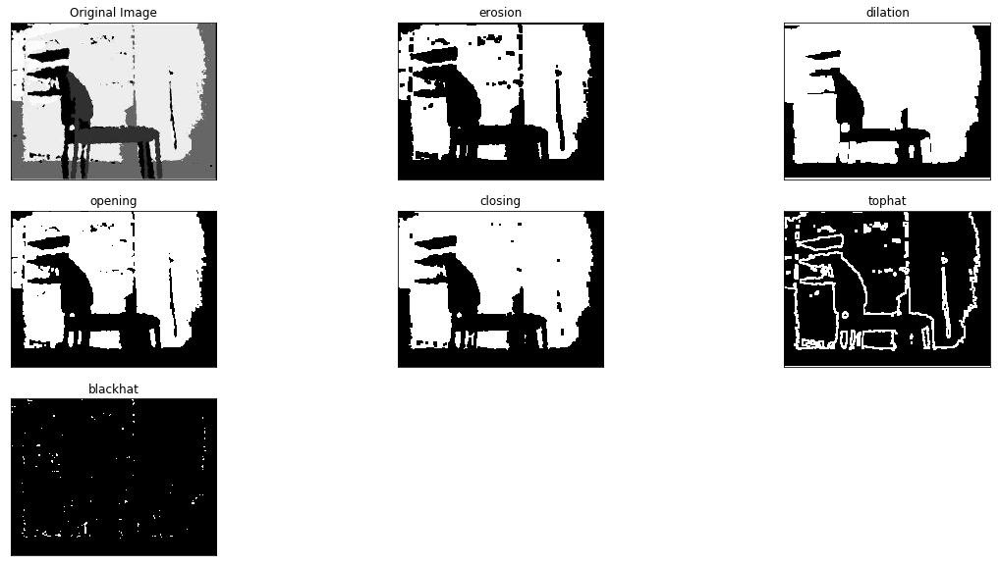

In [123]:
img = cv2.imread(r'./images/paint.JPG', cv2.IMREAD_GRAYSCALE)
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
plt.imshow(img)
plt.show()

_, mask = cv2.threshold(img, 200, 255, cv2.THRESH_BINARY)


erosion = cv.erode(mask,kernel,iterations = 1)
dilation = cv.dilate(mask,kernel,iterations = 2)
opening = cv.morphologyEx(mask, cv.MORPH_OPEN, kernel)
closing = cv.morphologyEx(mask, cv.MORPH_CLOSE, kernel)
gradient = cv.morphologyEx(mask, cv.MORPH_GRADIENT, kernel)
tophat = cv.morphologyEx(mask, cv.MORPH_TOPHAT, kernel)
blackhat = cv.morphologyEx(mask, cv.MORPH_BLACKHAT, kernel)


#plotting 
titles = ['Original Image', 'erosion','dilation', 'opening','closing','tophat', 'blackhat']
images = [img, erosion, dilation, opening, closing,gradient,tophat,blackhat]


plt.figure(figsize=(20,10))
for i in range(7):
    plt.subplot(3,3,i+1),plt.imshow(images[i])
    plt.title(titles[i])
    plt.xticks([]),plt.yticks([])




## SMOOTHING IMAGES

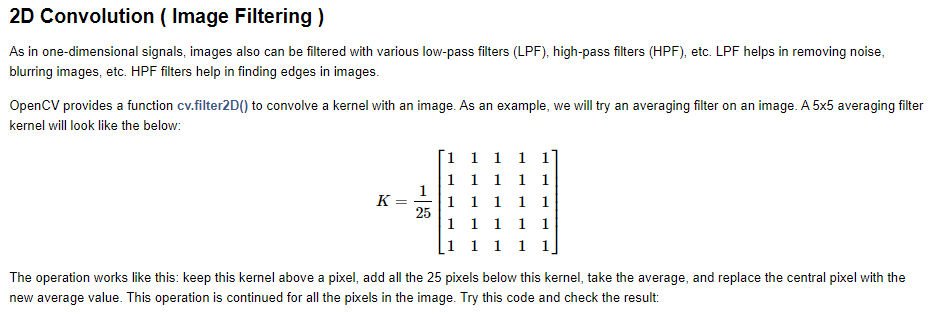

Remove noise is the most common for of smoothing
 - https://docs.opencv.org/master/d4/d13/tutorial_py_filtering.html
    

In [150]:
# first we make take a noisy image and apply out techniques
# the below function will take a grayscale image and let us know if its noisy or not

def estimate_noise(I):

  H, W = I.shape

  M = [[1, -2, 1],
       [-2, 4, -2],
       [1, -2, 1]]

  sigma = np.sum(np.sum(np.absolute(convolve2d(I, M))))
  sigma = sigma * math.sqrt(0.5 * math.pi) / (6 * (W-2) * (H-2))

  return sigma

The Image has :  17.863939843917034


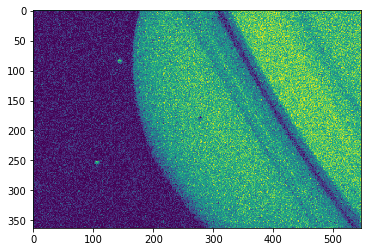

In [155]:
# finding if the image has noise or not

img = cv2.imread(r'./images/smoothing.JPG')
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
img = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
noise = estimate_noise(img)
print("The Image has : " , noise)
plt.imshow(img)
plt.show()

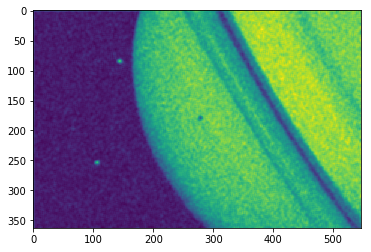

In [159]:
kernel = np.ones((5,5), np.float32)/25
dst = cv2.filter2D(img, -1, kernel)
plt.imshow(dst)
plt.show()

> ## Linear filter 
    - Point based filter
    - Multiply each pixel with a scalar value with each pixel being increased and decreased with a certain value

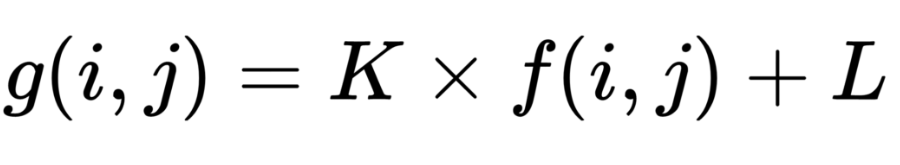

- varying K changes the brightness of the image and varying L changes the contrast of the image

> ## 2D image filtering 
    - Pixels have information around the pixel as well
    - In neighborhood filters, there is a kernel matrix which captures local region information around a pixel
    - We define a matrix smaller than the given image which operates in the neighborhood of a target pixel. This matrix is termed kernel
    - The operation is defined first by superimposing the kernel matrix on the original image, then taking the product of the corresponding pixels and returning a summation of all the products


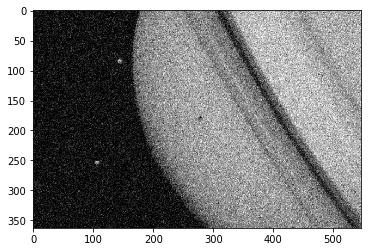

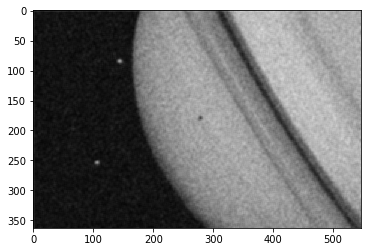

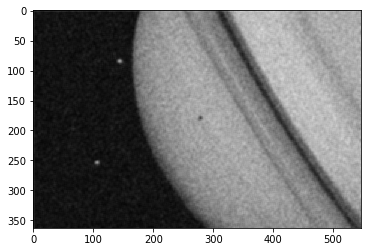

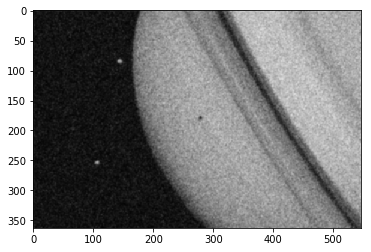

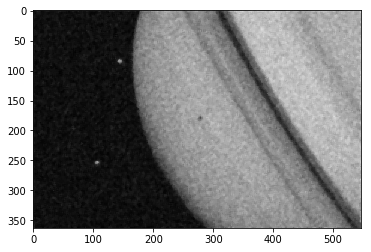

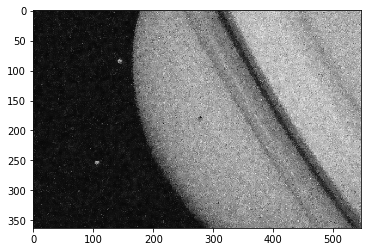

In [19]:
img = cv2.imread(r'./images/smoothing.JPG')
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

kernel = np.ones((5,5), np.float32)/25
destination_img =  cv2.filter2D(img, -1, kernel)

plt.imshow(img)
plt.show()
plt.imshow(destination_img)
plt.show()

# averaging algorithm for blurring
blur = cv2.blur(img, (5,5))
plt.imshow(blur)
plt.show()

# gaussian blur
gaus_blur = cv2.GaussianBlur(img, (5,5), 0)
plt.imshow(gaus_blur)
plt.show()

# Median blue --> great for 'Salt and pepper noise'
median_blur = cv2.medianBlur(img, 5) # kernel size must be odd here except 1
plt.imshow(median_blur)
plt.show()

# bilateral filter
bilat_blur = cv2.bilateralFilter(img,9, 75, 75) # edges are preserved in a better way
plt.imshow(bilat_blur)
plt.show()

## IMAGE GRADIENT and EDGE DETECTION

- Image gradient is a direction change in the intensity or color of an image
- can be used to get the edges in an image

3 types discussed:

- Laplacian derivative
- sobel X function
- Sobel Y function


Note:
output datatype is cv2.CV_8U or np.uint8. But there is a slight problem with that. Black-to-White transition is taken as Positive slope (it has a positive value) while White-to-Black transition is taken as a Negative slope (It has negative value). So when you convert data to np.uint8, all negative slopes are made zero. In simple words, you miss that edge.

If you want to detect both edges, better option is to keep the output datatype to some higher forms, like cv2.CV_16S, cv2.CV_64F etc, take its absolute value and then convert back to cv2.CV_8U. Below code demonstrates this procedure for a horizontal Sobel filter and difference in results

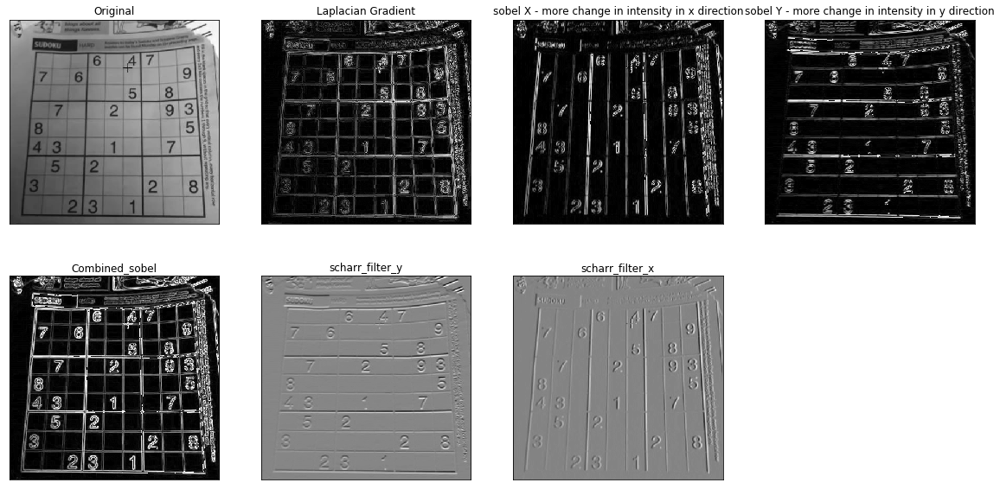

In [61]:
img = cv2.imread(r'./images/soduku.JPG', cv2.IMREAD_GRAYSCALE)

# laplacian method
lap = cv2.Laplacian(img, cv2.CV_64F, ksize = 3) # ksize is kernel size
lap = np.uint8(np.absolute(lap))# converting the lap to the format that is desired for the output

# SobelX and Sobel Y

sobelX = cv2.Sobel(img, cv2.CV_64F, 1, 0) # 1 : dx means that we want to use sobel X, can be 1 or 0 ; 0 : dy value for the y direction
sobelY = cv2.Sobel(img, cv2.CV_64F, 0, 1) # 0, 1 : direction of derivatives to be taken, vertical or horizontal
sobelX = np.uint8(np.absolute(sobelX))
sobelY = np.uint8(np.absolute(sobelY))

# scharr filter
scharr_filter_y = cv2.Scharr(img, cv2.CV_64F, 0,1, -1) # If ksize = -1, a 3x3 Scharr filter is used which gives better results than 3x3 Sobel filter
scharr_filter_x = cv2.Scharr(img, cv2.CV_64F, 1,0, -1)

# combined Sobel
Combined_sobel = cv2.bitwise_or(sobelX,sobelY)

#plotting 
titles = ['Original', 'Laplacian Gradient','sobel X - more change in intensity in x direction','sobel Y - more change in intensity in y direction', 'Combined_sobel','scharr_filter_y','scharr_filter_x']
images = [img, lap, sobelX, sobelY, Combined_sobel, scharr_filter_y,scharr_filter_x]
plt.figure(figsize=(20,10))
for i in range(7):
    plt.subplot(2,4,i+1),plt.imshow(images[i], 'gray')
    plt.title(titles[i])
    plt.xticks([]),plt.yticks([])
plt.show()